# Avance 1. Análisis exploratorio de datos

DOMÉNICO MORALES ORTIZ 		A00820324

MÓNICA DODERO ARROYO		    A01795330

OSCAR ANTONIO SUÁREZ V 	    A01323987

INSTITUTO TECNOLÓGICO Y DE ESTUDIOS SUPERIORES DE MONTERREY
TC5035 - Proyecto Integrador

Dra. Grettel Barceló Alonso

Dr. Luis Eduardo Falcón Morales

Mtra. Verónica Sandra Guzmán de Valle

## Instalación de módulos y referencias de librerías

In [1]:
!pip install astropy
!pip install kaggle

In [18]:
from google.colab import drive
from google.colab import userdata
import os
import cv2
import json
import kagglehub
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from collections import defaultdict
from torchvision import transforms
from astropy.io import fits
import torch
from astropy.visualization import ZScaleInterval, LogStretch, MinMaxInterval, LinearStretch
from astropy.visualization import make_lupton_rgb

In [9]:
#Se necesita montar el drive y acceder a la carpeta donde están los archivos
drive.mount('/content/drive')

# Cargar el archivo kaggle.json
with open('/content/drive/MyDrive/kaggle.json') as f:
    kaggle_token = json.load(f)

# Configurar las variables de entorno
os.environ['KAGGLE_USERNAME'] = kaggle_token['username']
os.environ['KAGGLE_KEY'] = kaggle_token['key']

path = kagglehub.dataset_download("domenicomoralesortiz/fits-sdss-4class", )

print("Path to dataset files:", path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


100%|██████████| 25.2G/25.2G [04:50<00:00, 93.3MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/domenicomoralesortiz/fits-sdss-4class/versions/1


In [10]:
# Direcciones a partir de la descarga
DOWNLOAD_PATH = Path(path) / "ls_dr10_cutouts_combined"
FITS_PATH = DOWNLOAD_PATH / "fits"
CSV_PATH = DOWNLOAD_PATH / "lsdr10_paths.csv"

print("FITS path:", FITS_PATH)
print("CSV path:", CSV_PATH)

FITS path: /root/.cache/kagglehub/datasets/domenicomoralesortiz/fits-sdss-4class/versions/1/ls_dr10_cutouts_combined/fits
CSV path: /root/.cache/kagglehub/datasets/domenicomoralesortiz/fits-sdss-4class/versions/1/ls_dr10_cutouts_combined/lsdr10_paths.csv


## Exploración general del dataset ✨

El dataset construido para uso en este análisis comprende un conjunto de imágenes de galaxias 🌌 centradas mediante sus coordenadas de Ascensión Recta (RA) y Declinación (DEC) que se encuentran en el archivo csv proporcionado, utilizando únicamente las clases relevantes:

*   **none:** galaxia sin anillo
*   **inner:** galaxia con anillo interno
*   **outer:** galaxia con anillo externo
*   **inner+outer:** galaxio con anillo interno y externo

Estas imágenes fueron adquiridas a través de solicitudes a la API de DESI Legacy Imaging Surveys, especificando los siguientes parámetros para asegurar la consistencia y relevancia de los datos:

*   **Capa de datos (layer):** ls-dr10 ✨
*   **Escala de arcsec/pix (pixscale):** 0.262 📐
*   **Tamaño de imagen (size):** 512x512 píxeles 🖼️
*   **Bandas espectrales (bands):** griz 🌈

Un ejemplo ilustrativo de la estructura de las solicitudes empleadas es el siguiente:

> `https://www.legacysurvey.org/viewer/fits-cutout?ra=243.708880&dec=-0.915654&layer=ls-dr10&pixscale=0.262&size=512&bands=griz`

Se puede encontrar la ejecución de este proceso en paralelo en el Jupyter Notebook "Construcción del dataset". 🛠️

### Análisis de clases
Haciendo un primer análisis del conjunto de datos construido, podemos extraer la distribución de clases con apoyo del archivo csv para comprender mejor su composición. 📊🔍

ring_type
none           6660
inner           857
inner+outer     372
outer           186
Name: count, dtype: int64


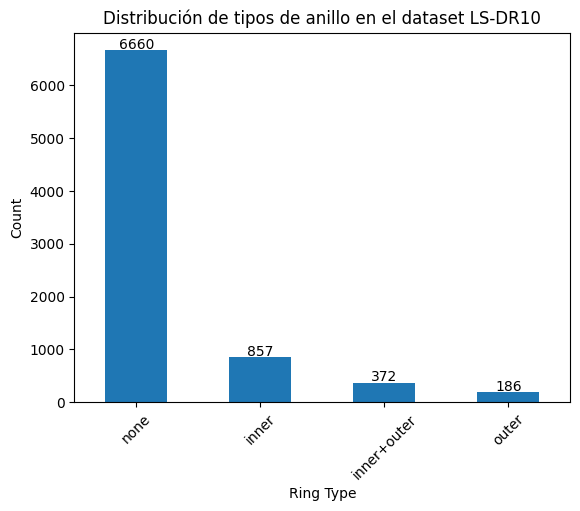

In [11]:
import matplotlib.pyplot as plt

df = pd.read_csv(CSV_PATH)

RING_TYPE = list(df["ring_type"].unique())

# Mostrar la cuenta de galaxias según su tipo de anillo
print(df["ring_type"].value_counts())

# Plot the distribution of ring types as a bar chart
df["ring_type"].value_counts().plot(kind="bar")

# Set axis labels and title
plt.xlabel("Ring Type")
plt.ylabel("Count")
plt.title("Distribución de tipos de anillo en el dataset LS-DR10")
plt.xticks(rotation=45)

# Annotate each bar with its count
for i, v in enumerate(df["ring_type"].value_counts()):
    plt.text(i, v + 25, str(v), ha='center')

# Display the plot
plt.show()

### Visualización de datos
Haciendo una reconstrucción de imágen RGB utilizando las bandas g, r y z, podemos visualizar ejemplos de galaxias por cada clase.

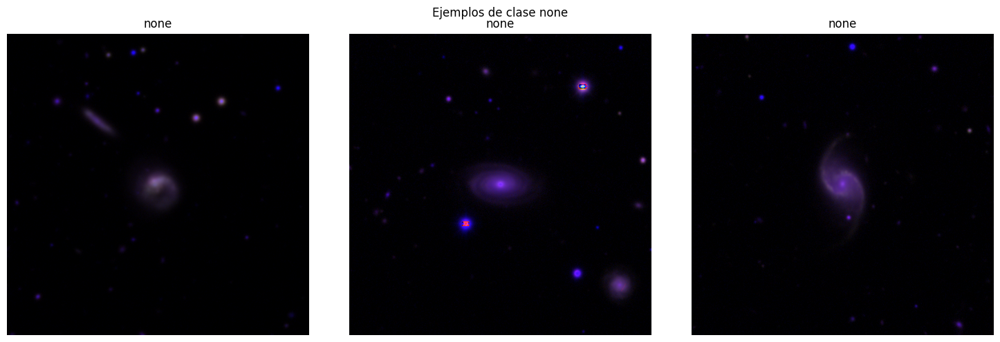

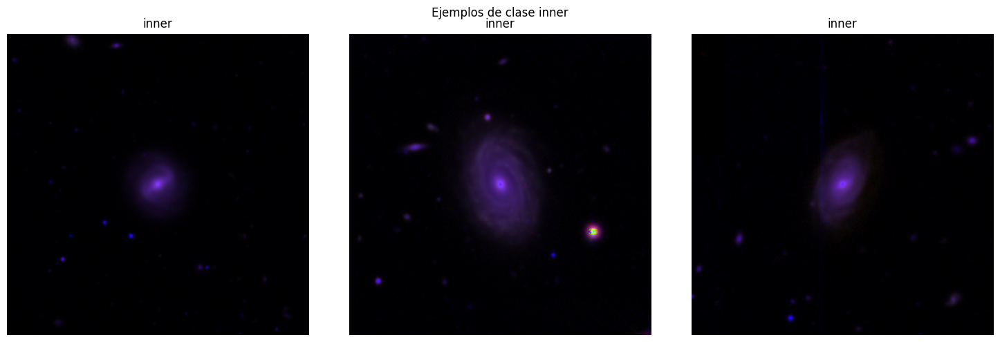

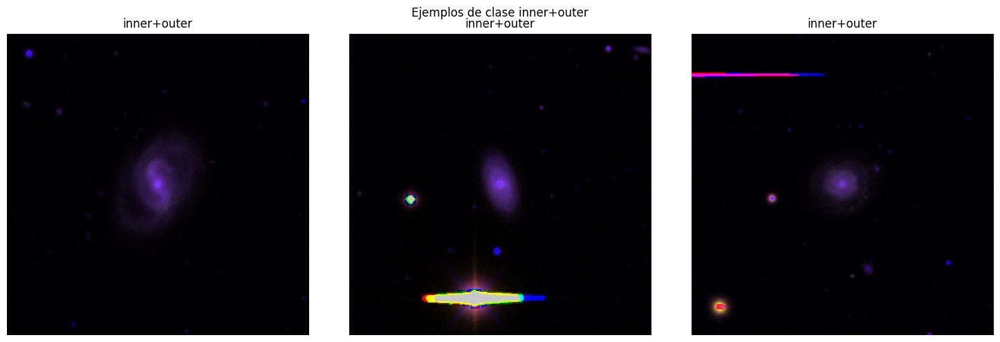

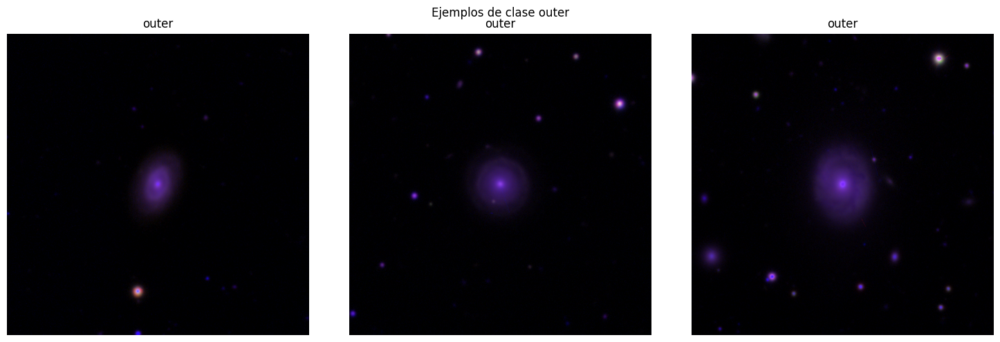

In [12]:
def channels_to_rgb(r, g, z):
    """ Convertir los canales en una imágen RGB compuesta.

    Args:
        r (np.ndarray): Canal rojo.
        g (np.ndarray): Canal verde.
        z (np.ndarray): Canal azul.

    Returns:
        np.ndarray: Imagen RGB compuesta.
    """
    # Se utiliza la función make_lupton_rgb debido a que ayuda
    # a manejar el alto rango de imágenes astronómicas controlando
    # el contraste y la saturación, manteniendo el color.
    rgb_img = make_lupton_rgb(r, g, z, stretch=0.5, Q=8)
    return rgb_img

def plot_rgb_sample_images(dataset_path, samples_per_class=3):
  """ Visualizar ejemplos de cada clase en formato RGB según sea indicado.

  Args:
      dataset_path (Path): Ruta al dataset.
      samples_per_class (int): Número de imágenes a mostrar por clase.
  """
  for class_name in RING_TYPE:
    ring_type_files = list(FITS_PATH.glob(f"*_{class_name}_*.fits"))
    sample_files = np.random.choice(ring_type_files,
                                    size=min(samples_per_class, len(ring_type_files)),
                                    replace=False)
    fig, axs = plt.subplots(1, samples_per_class, figsize=(5 * samples_per_class, 5))
    for i, fits_file in enumerate(sample_files):
        with fits.open(fits_file) as hdul:
            data = hdul[0].data
            rgb_img = channels_to_rgb(data[1], data[0], data[3])
            axs[i].imshow(rgb_img, cmap='gray', origin='lower')
            axs[i].set_title(f"{class_name}")
            axs[i].axis('off')
    plt.suptitle(f"Ejemplos de clase {class_name}")
    plt.tight_layout()
    plt.show()

plot_rgb_sample_images(FITS_PATH)


De igual manera, podemos visualizar ejemplos de cada clase según las bandas g, r, i y z.

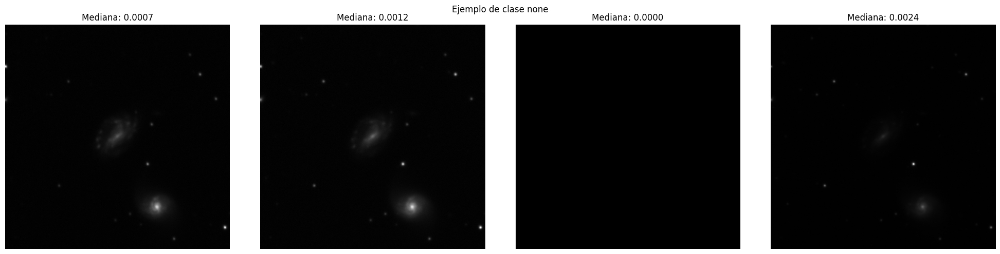

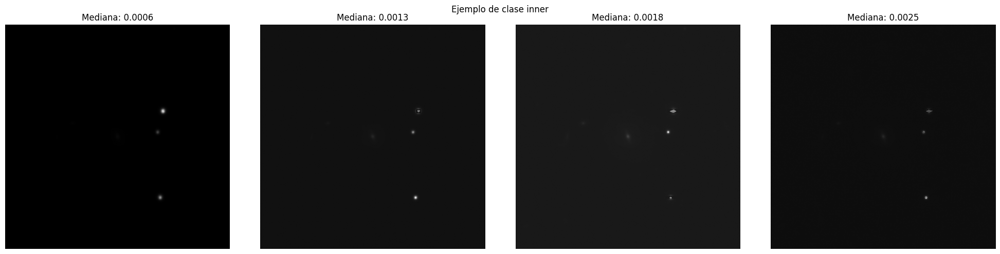

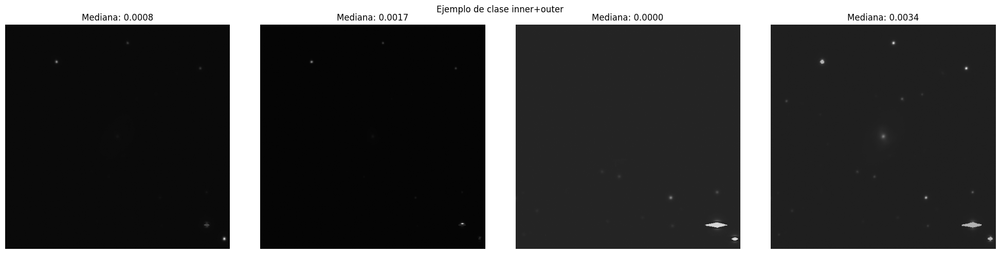

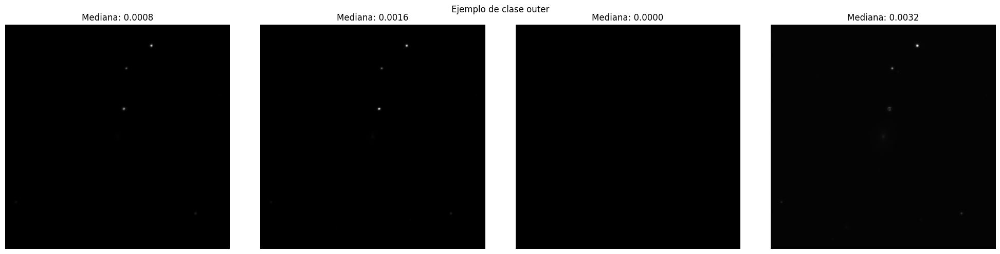

In [13]:
def plot_channels_sample_image(dataset_path, transforms=None):
  """ Visualizar los canales de un ejemplo de cada clase.

  Args:
      dataset_path (Path): Ruta al dataset.
      transforms (callable, optional): Transformaciones a aplicar a las imágenes.
  """
  for class_name in RING_TYPE:
    ring_type_files = list(FITS_PATH.glob(f"*_{class_name}_*.fits"))
    sample_files = np.random.choice(ring_type_files,
                                    size=min(1, len(ring_type_files)),
                                    replace=False)
    fig, axs = plt.subplots(1, 4, figsize=(5 * 4, 5))
    for i, fits_file in enumerate(sample_files):
        with fits.open(fits_file) as hdul:
            data = hdul[0].data
            for i in range(data.shape[0]):
              img = data[i].astype(np.float64)

              if transforms is not None:
                rendered_img = transforms(img)
              else:
                rendered_img = img

              axs[i].imshow(rendered_img, cmap='gray')
              axs[i].axis('off')
              # add median to 3 decimals
              axs[i].set_title(f"Mediana: {np.median(rendered_img):.4f}")

    plt.suptitle(f"Ejemplo de clase {class_name}")
    plt.tight_layout()
    plt.show()

plot_channels_sample_image(FITS_PATH)

## Transformaciones, estadísticas e histogramas 📈📊

Los histogramas son herramientas indispensables 🛠️ para ayudarnos a comprender la composición de las imágenes, evaluar los rangos y detectar señales clave. Los parámetros asociados a estas gráficas nos brindan una perspectiva valiosa del comportamiento de nuestro conjunto de datos. 🔍

Debido a la naturaleza del origen de los datos 🌌, la información crucial puede estar oculta detrás de ruido, saturación o bajo contraste. Por lo tanto, el uso de transformaciones es esencial para obtener una mejor visualización y analizar la distribución de intensidades de manera efectiva.

### Transformaciones

Se exploraron diversas transformaciones; sin embargo, la que generalmente proporciona una excelente visualización global es el uso de un estiramiento logarítmico. 📈

Este estiramiento permite hacer visibles detalles débiles y brillantes de manera simultánea, comprimiendo los picos de brillo intenso y estirando las sombras para revelar estructuras sutiles. Previamente a esto, es fundamental extraer límites de contraste adecuados y poder ignorar el ruido extremo que pueda distorsionar la información. 🔍

Finalmente, ajustamos la mediana de las imágenes resultantes para obtener uniformidad y consistencia entre todos los canales espectrales. Esto asegura que la comparación y el análisis visual sean más fiables. ✅

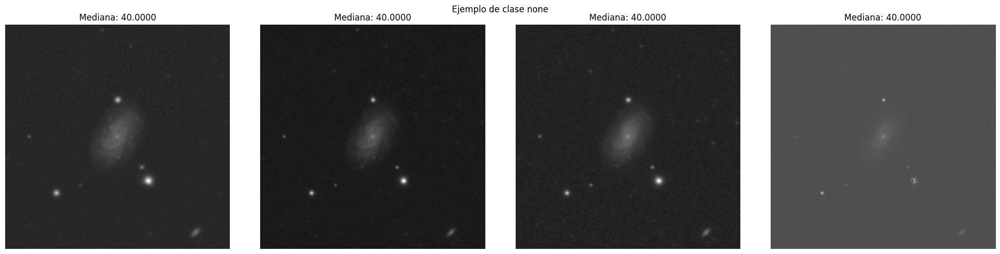

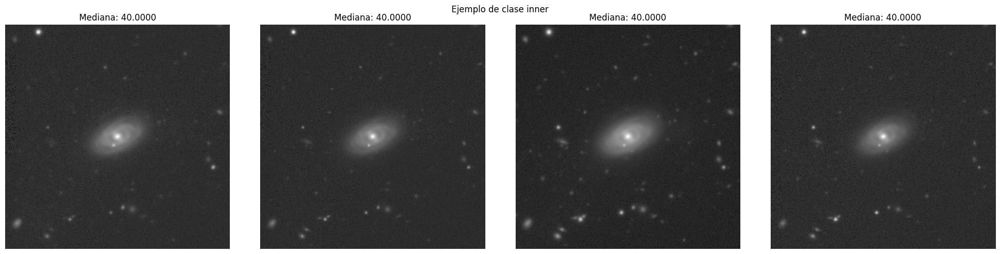

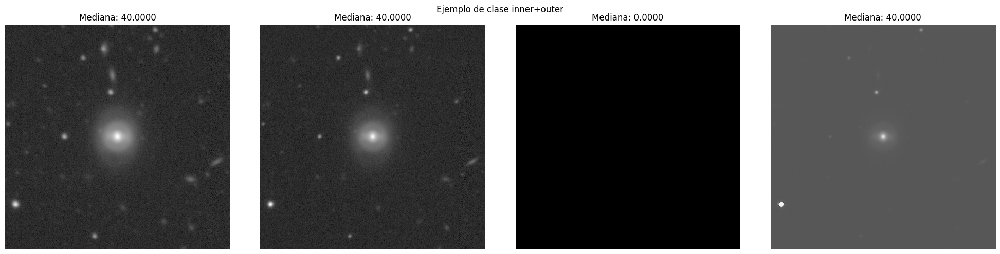

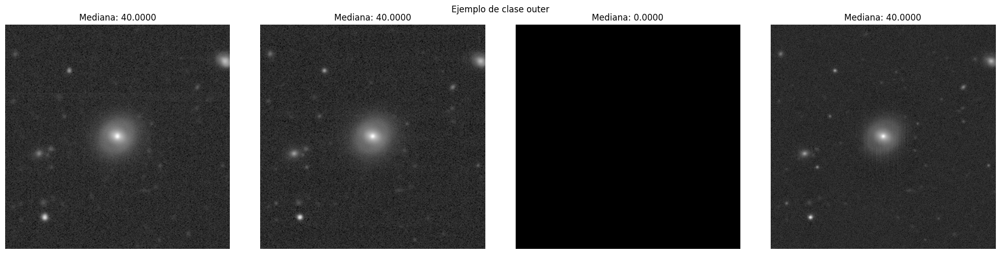

In [14]:
def log_n_scale_transform(img_data, log_a=1000, clip_mode='minmax', med_val=40):
    """
    Aplicar la transformación Log-N a una imagen usando escala Zscale o Min/Max.

    Pasos del proceso:
    1. Calcular los límites de intensidades.
    2. Normalizar los valores a un rango de 0 a 1.
    3. Aplicar la transformación Log-N.
    4. Escalar la imagen de vuelta al rango original.
    5. Modificar la mediana para mantener consistencia.

    Args:
      img_data (np.ndarray): Imagen de entrada.
      log_a (float): Factor de escala para la transformación Log-N.
      clip_mode (str): Modo de escala ('zscale' o 'minmax').

    Returns:
        np.ndarray: Imagen transformada.
    """
    img = img_data.astype(np.float64)

    # 1. Calculate Clipping Limits
    if clip_mode == 'zscale':
        interval = ZScaleInterval()
    elif clip_mode == 'minmax':
        interval = MinMaxInterval()
    p_low, p_high = interval.get_limits(img)

    # Handle flat image
    if p_high <= p_low:
        return np.zeros_like(img, dtype=np.uint8)

    # 2. Normalize Pixel Values (x) to the 0 to 1 range
    x = (img - p_low) / (p_high - p_low)
    x = np.clip(x, 0.0, 1.0)

    # 3. Apply the DS9 Log Scale Distribution (y)
    # The 'a' parameter in LogStretch is the factor log_a
    log_stretch = LogStretch(a=log_a)
    y = log_stretch(x)

    # 4. Scale back to 8-bit (0-255) and convert type
    display_image = (y * 255.0).astype(np.uint8)

    # set median for consistency
    if med_val:
      median_val = np.median(display_image)
      rendered_img = np.clip(display_image - median_val + med_val, 0, 255).astype(np.uint8)
    else:
      rendered_img = display_image

    return rendered_img

plot_channels_sample_image(FITS_PATH, log_n_scale_transform)

### Histogramas y estadísticas
Obteniendo el histograma de los canales podemos extraer diversas métricas que nos ayudan a comprender la distribución y composición de los canales.

Podemos discernir en cuanto a qué rango de valores corresponden a la señal y cuáles corresponden en cuanto a valores saturados o el fondo.

Con el promedio, la desviación estándar y la entropía,

Observando los resultados de los histogramas de cada clase de las imágenes transformadas sin modificar la mediana, podemos observar


Ring type: none, Mean: 84.68425769805908, Stddev: 61.05618904870476
Channel g: Mean=88.78460960388183, Stddev=39.297089728977674, Entropy=6.2570
Channel r: Mean=94.08220138549805, Stddev=56.44232425032348, Entropy=6.1829
Channel i: Mean=30.64248733520508, Stddev=55.76474709187804, Entropy=2.1248
Channel z: Mean=125.22773246765136, Stddev=49.013346312915225, Entropy=5.9182


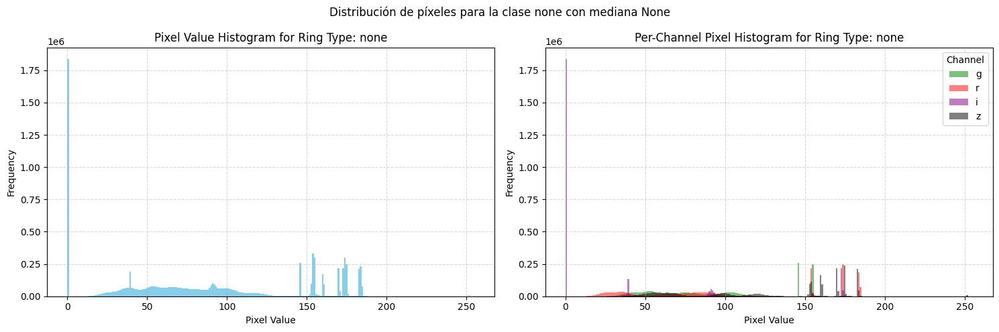


Ring type: inner, Mean: 83.75514469146728, Stddev: 55.6303367056047
Channel g: Mean=86.68373908996583, Stddev=53.809527038065895, Entropy=6.2798
Channel r: Mean=96.71122741699219, Stddev=56.95476460057211, Entropy=6.0521
Channel i: Mean=50.57738342285156, Stddev=52.12844017004755, Entropy=4.4784
Channel z: Mean=101.04822883605956, Stddev=44.113506047648464, Entropy=6.0319


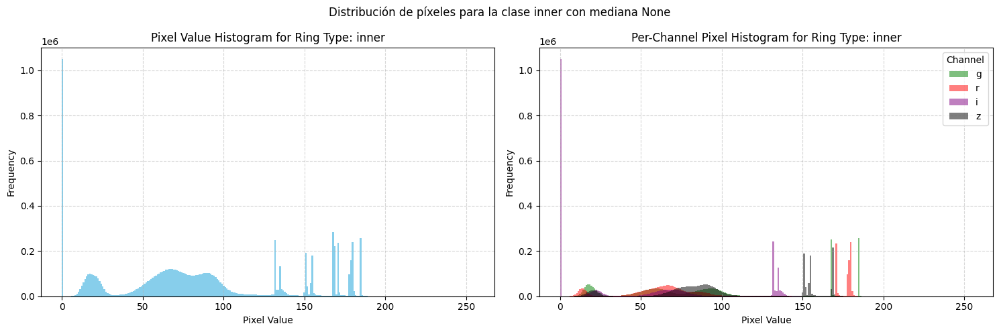


Ring type: inner+outer, Mean: 96.01243658065796, Stddev: 63.37500698171038
Channel g: Mean=119.98288764953614, Stddev=47.03728205774893, Entropy=5.2694
Channel r: Mean=111.59695777893066, Stddev=51.36133965323523, Entropy=5.5002
Channel i: Mean=29.435087203979492, Stddev=53.52610164940809, Entropy=2.3441
Channel z: Mean=123.03481369018554, Stddev=48.68076855895576, Entropy=5.4566


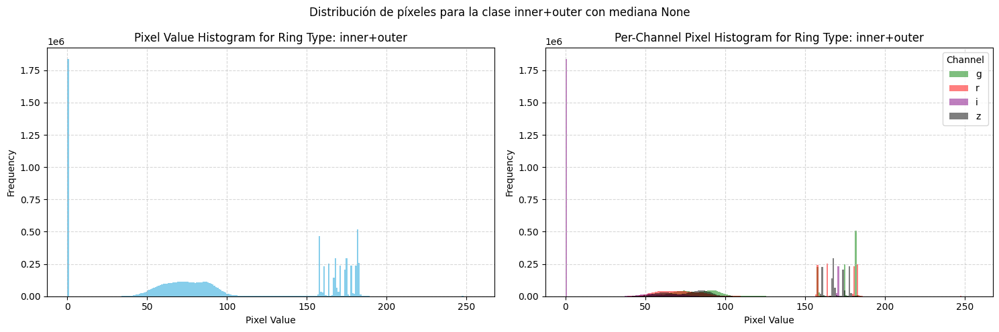


Ring type: outer, Mean: 57.75556411743164, Stddev: 38.5599769612288
Channel g: Mean=64.02862854003907, Stddev=24.895671038338698, Entropy=6.5050
Channel r: Mean=50.7615852355957, Stddev=24.724153691698273, Entropy=6.4459
Channel i: Mean=46.127764511108396, Stddev=55.3737763046718, Entropy=4.5122
Channel z: Mean=70.10427818298339, Stddev=35.69580420630614, Entropy=6.1026


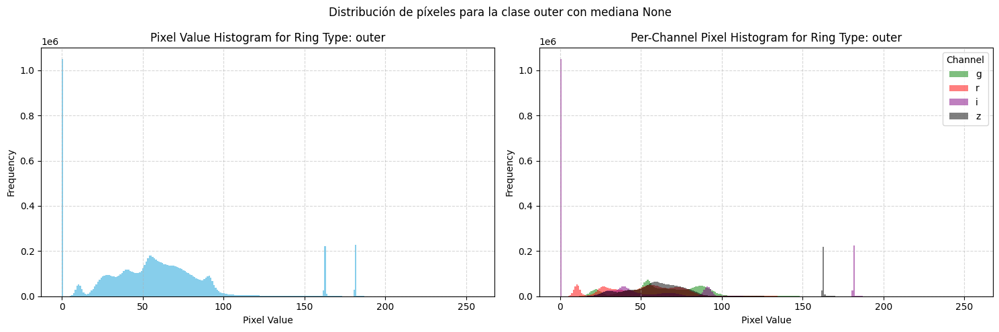

In [15]:
def plot_histograms(dataset_path, samples_per_class=50, transforms=None, med_val=40):
  """ Visualizar los histogramas de cada clase.

  Args:
      dataset_path (Path): Ruta al dataset.
      samples_per_class (int): Número de imágenes a mostrar por clase.
      transforms (callable, optional): Transformaciones a aplicar a las imágenes.
  """
  class_stats = {}

  for class_name in RING_TYPE:
    ring_type_files = list(FITS_PATH.glob(f"*_{class_name}_*.fits"))
    sample_files = np.random.choice(ring_type_files,
                                    size=min(samples_per_class, len(ring_type_files)),
                                    replace=False)
    pixel_values = []
    channel_values = []
    channel_labels = ["g", "r", "i", "z"]
    channel_colors = ["green", "red", "purple", "black"]

    for i, fits_file in enumerate(sample_files):
        with fits.open(fits_file) as hdul:
            data = hdul[0].data
            # transform for each channel and merge back
            rendered_img = np.zeros((4, 512, 512), dtype=np.uint8)
            for i in range(data.shape[0]):
              img = data[i].astype(np.float64)

              if transforms is not None:
                rendered_img[i] = transforms(img, med_val=med_val)
              else:
                rendered_img[i] = img

            # Flatten and store pixel values
            pixel_values.extend(rendered_img.flatten())
            # Per-channel values
            for ch in range(rendered_img.shape[0]):
                if len(channel_values) <= ch:
                    channel_values.append([])
                channel_values[ch].extend(rendered_img[ch].flatten())
        print(i, end="\r")

    pixel_values = np.array(pixel_values)
    channel_values = [np.array(ch_vals) for ch_vals in channel_values]
    mean = np.mean(pixel_values)
    stddev = np.std(pixel_values)
    channel_means = [np.mean(ch_vals) for ch_vals in channel_values]
    channel_stds = [np.std(ch_vals) for ch_vals in channel_values]
    class_stats[class_name] = {
        "mean": mean,
        "stddev": stddev,
        "channel_means": channel_means,
        "channel_stds": channel_stds
    }
    print(f"\nRing type: {class_name}, Mean: {mean}, Stddev: {stddev}")
    for idx, (ch_vals, cm, cs) in enumerate(zip(channel_values, channel_means, channel_stds)):
        hist, _ = np.histogram(ch_vals, bins=256, range=(0, 255), density=True)
        hist = hist[hist > 0]
        entropy = -np.sum(hist * np.log2(hist))
        print(f"Channel {channel_labels[idx]}: Mean={cm}, Stddev={cs}, Entropy={entropy:.4f}")

    # Plot histogram for all pixels
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].hist(pixel_values, bins=256, color='skyblue')
    axs[0].set_title(f"Pixel Value Histogram for Ring Type: {class_name}")
    axs[0].set_xlabel("Pixel Value")
    axs[0].set_ylabel("Frequency")
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Plot all channel histograms in a single figure with color coding
    for idx, (ch_vals, label, color) in enumerate(zip(channel_values, channel_labels, channel_colors)):
        axs[1].hist(ch_vals, bins=256, color=color, alpha=0.5, label=label)
    axs[1].set_title(f"Per-Channel Pixel Histogram for Ring Type: {class_name}")
    axs[1].set_xlabel("Pixel Value")
    axs[1].set_ylabel("Frequency")
    axs[1].legend(title="Channel")
    axs[1].grid(True, linestyle='--', alpha=0.5)
    plt.suptitle(f"Distribución de píxeles para la clase {class_name} con mediana {med_val}")
    plt.tight_layout()

    plt.show()

plot_histograms(FITS_PATH, samples_per_class=10, transforms=log_n_scale_transform, med_val=None)


Ring type: none, Mean: 32.30457611083985, Stddev: 20.65026566013556
Channel g: Mean=42.11474876403808, Stddev=14.293101792590507, Entropy=5.0465
Channel r: Mean=42.24074249267578, Stddev=14.04638368676277, Entropy=4.9647
Channel i: Mean=4.2712150573730465, Stddev=13.718368311490787, Entropy=0.9975
Channel z: Mean=40.59159812927246, Stddev=8.150806643318587, Entropy=3.8113


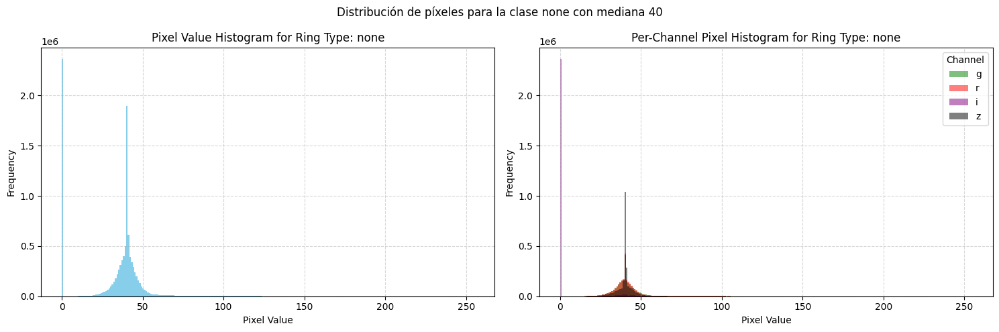


Ring type: inner, Mean: 35.30653800964355, Stddev: 18.47889148517929
Channel g: Mean=42.019758987426755, Stddev=13.39309491617275, Entropy=4.7545
Channel r: Mean=41.89364433288574, Stddev=13.081645408931019, Entropy=4.8003
Channel i: Mean=16.396974945068358, Stddev=20.88571010672205, Entropy=2.5305
Channel z: Mean=40.91577377319336, Stddev=10.083054627889165, Entropy=4.4245


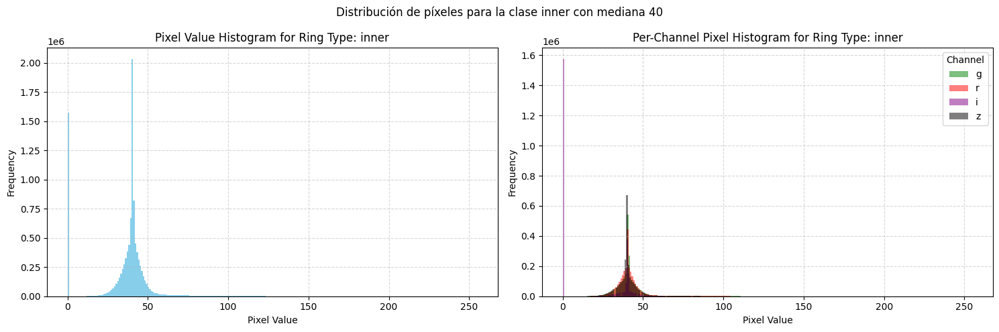


Ring type: inner+outer, Mean: 34.85767879486084, Stddev: 17.394690369744183
Channel g: Mean=41.73779487609863, Stddev=13.115133518859208, Entropy=4.6471
Channel r: Mean=40.85307502746582, Stddev=9.563204593250257, Entropy=3.7822
Channel i: Mean=16.13771209716797, Stddev=20.280487012170155, Entropy=2.2485
Channel z: Mean=40.70213317871094, Stddev=8.225914903008709, Entropy=3.8307


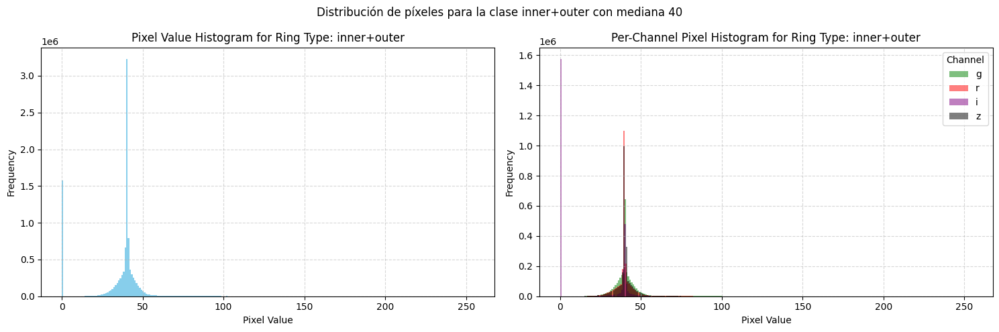


Ring type: outer, Mean: 36.05250883102417, Stddev: 16.75869543464369
Channel g: Mean=41.13935317993164, Stddev=10.62912527350745, Entropy=4.1485
Channel r: Mean=41.322517776489256, Stddev=10.571663916891918, Entropy=3.9147
Channel i: Mean=20.706980514526368, Stddev=22.036026388470336, Entropy=3.0089
Channel z: Mean=41.04118385314941, Stddev=9.953368883723689, Entropy=4.2705


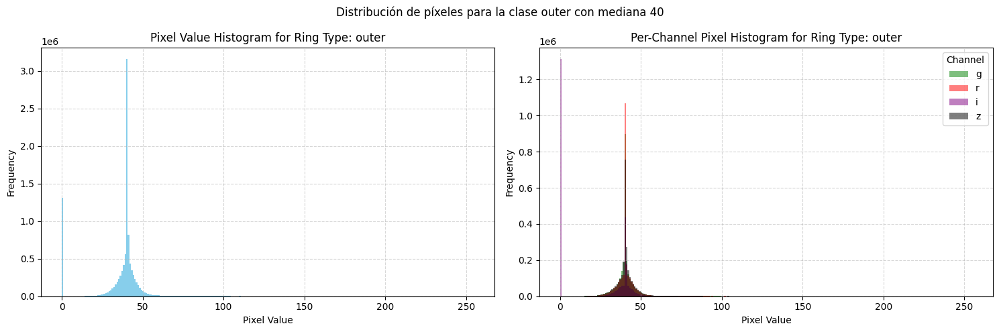

In [16]:
plot_histograms(FITS_PATH, samples_per_class=10, transforms=log_n_scale_transform)

## Análisis de relación señal-ruido

In [ ]:
# analizar la relacion señal-ruido por cada canal y combinacion de los mismos (1, 2, 3 y 4 canales)

## Aumentación de datos

Las transformaciones son necesarias para aumentar la cantidad de imágenes para alimentar a un modelo de machine learning. El aumento de imágenes (image augmentation) es un proceso ya incorporado al pipeline de entrenamiento de una IA que nos permite alcanzar mejores métricas al tener una mayor diversidad de datos (imágenes).

Entre estas transformaciones encontramos las geométricas y las fotométricas:

En esta área nos enfocaremos en tener diferentes vistas geométricas tales como:

1.   Cambio de tamaño
2.   Rotación
3.   Voltear
4.   Estirar

Se puede observar que pueden aparecer detalles con más claridad como el de los anillos un poco más estructurados, lo que nos permitirá tener un dataset más enriquecededor. Se intentó multiples variaciones pare verificar las imágenes en distintos matices pero de igual forma, es importante considerar si es necesario mantener la galaxia centralizada para entregas futuras.

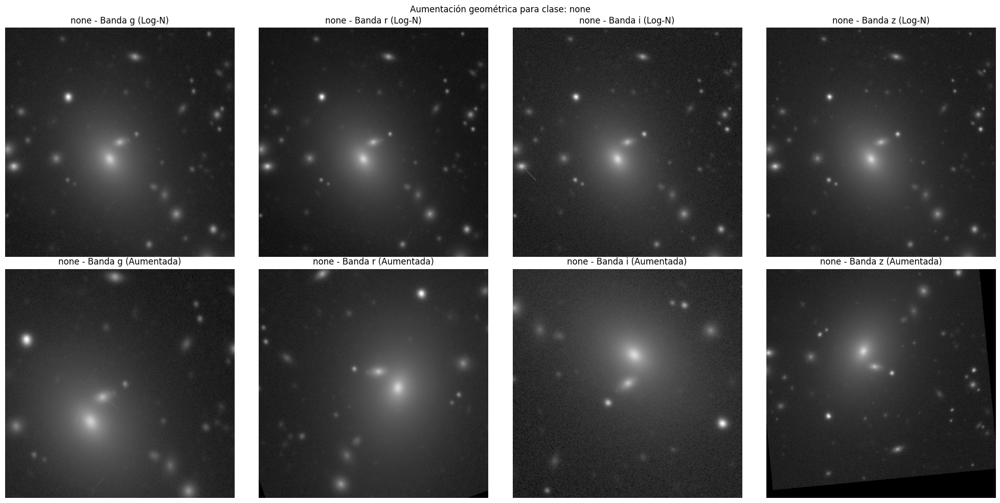

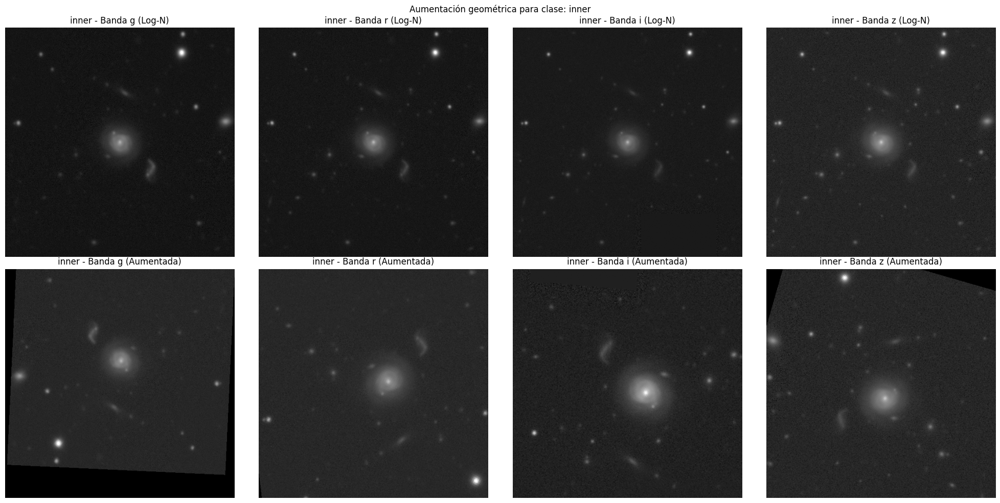

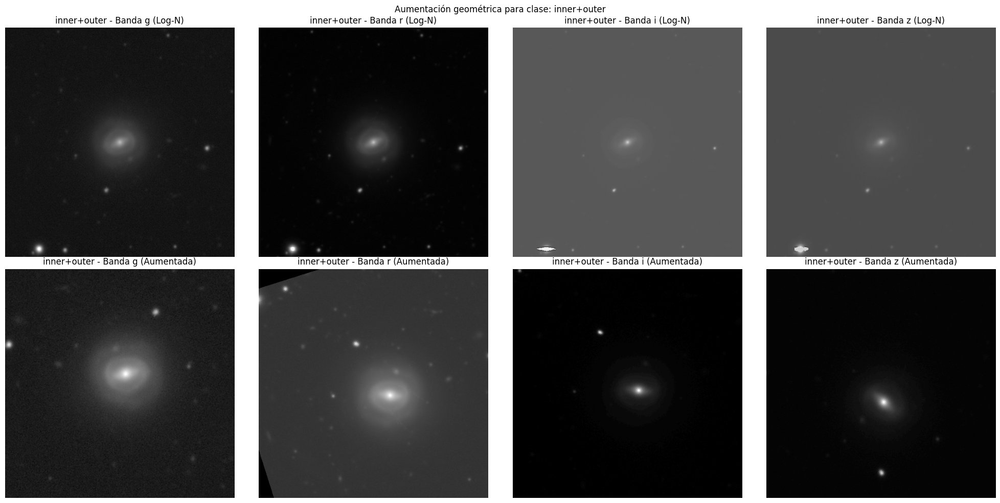

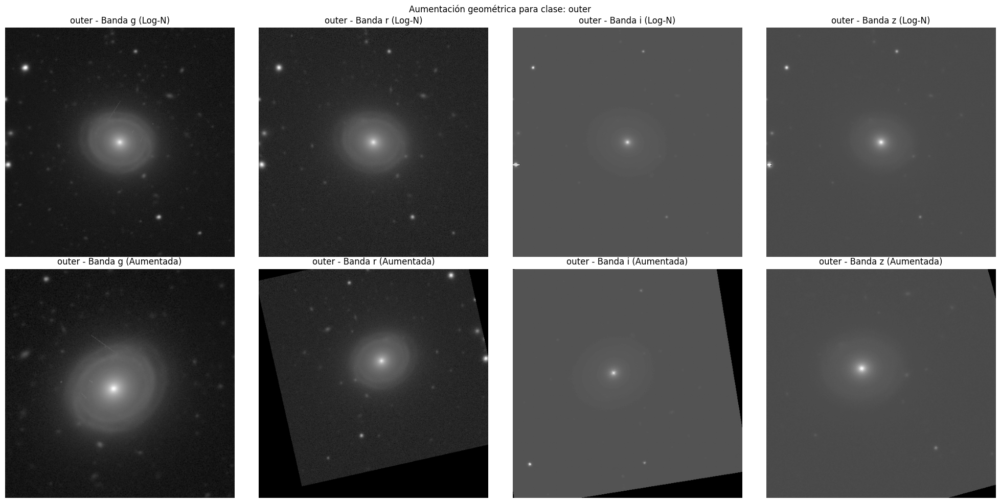

In [120]:
# usar las funciones de pytorch para obtener aumentación de datos y visualizar las imagenes (zoom, flip, rotation, affine)
def get_geometric_augmentations(degrees=30, translate=(0.1, 0.1), scale=(0.9, 1.1), hflip_prob=0.5, vflip_prob=0.5):
  #agrupamos todas las transformaciones con Compose
    return transforms.Compose([
        #convertimos el tensor en formato PIL
        transforms.ToPILImage(),
        #aplicamos una transformación afín aleatoria: rotación, desplazamiento (zoom/desplazamiento), y escalado.
        transforms.RandomAffine(degrees=degrees, translate=translate, scale=scale),
        #volteamos la imagen horizontalmente y verticalmente
        transforms.RandomHorizontalFlip(p=hflip_prob),
        transforms.RandomVerticalFlip(p=vflip_prob),
        transforms.ToTensor()
    ])

def visualize_augmentation(dataset_path, samples_per_class=3, transform=None):
  """ Aplica estas transformaciones a cada banda espectral (g, r, i, z).
      Muestra dos filas de imágenes:

              Fila 1: imagen con mejora de contraste usando Log-N.

              Fila 2: Misma imagen, pero con rotación, zoom, desplazamiento y flips aplicados.

  Args:
      dataset_path (Path): Ruta al dataset.
      samples_per_class (int): Número de imágenes a mostrar por clase.
      transforms (callable, optional): Transformaciones a aplicar a las imágenes.
  """
  for class_name in RING_TYPE:
          fits_files = list(FITS_PATH.glob(f"*_{class_name}_*.fits"))
          sample_files = np.random.choice(fits_files, size=min(samples_per_class, len(fits_files)), replace=False)

          for fits_file in sample_files:
              with fits.open(fits_file) as hdul:
                  data = hdul[0].data  # shape: (4, 512, 512)
                  fig, axs = plt.subplots(2, 4, figsize=(20, 10))

                  channel_labels = ["g", "r", "i", "z"]

                  for i in range(4):  # canales g, r, i, z
                      original = data[i].astype(np.float64)
                      # Aplicar transformación logarítmica junto con normalizacion a 0-255
                      log_scaled = log_n_scale_transform(original, log_a=1000, clip_mode='minmax', med_val=40)

                      # Aplicar transformaciones geométricas
                      augmented_tensor = transform(log_scaled)

                      # Visualizar
                      axs[0, i].imshow(log_scaled.squeeze(), cmap='gray', origin='lower')
                      axs[0, i].set_title(f"{class_name} - Banda {channel_labels[i]} (Log-N)")
                      axs[0, i].axis('off')

                      axs[1, i].imshow(augmented_tensor.squeeze(), cmap='gray', origin='lower')
                      axs[1, i].set_title(f"{class_name} - Banda {channel_labels[i]} (Aumentada)")
                      axs[1, i].axis('off')
                  plt.suptitle(f"Aumentación geométrica para clase: {class_name}")
                  plt.tight_layout()
                  plt.show()


#Se intentó multiples variaciones pare verificar las imágenes en distintos matices
geom_transform = get_geometric_augmentations(degrees=27, translate=(0.1, 0.1), scale=(0.9, 1.5), hflip_prob=0.5, vflip_prob=0.5)
visualize_augmentation(FITS_PATH, samples_per_class=1, transform=geom_transform)

# Analisis de la Relación Señal a Ruido (SNR)

## Constantes

In [ ]:
# Rutas
CSV = "Dataset/ls_dr10_cutouts_combined/combined_with_lsdr10_paths.csv"
FITS = "Dataset/ls_dr10_cutouts_combined/fits/"

### Funciones para leer el archivo FITS y calcular SNR 

In [ ]:
def _band_order_from_hdr(hdr):
    names=[]
    n3 = int(hdr.get('NAXIS3', 1))
    for k in range(n3):
        b = hdr.get(f'BAND{k}')
        if b: names.append(b.strip())
    if not names and 'BANDS' in hdr:
        names = list(hdr['BANDS'].strip())
    if not names:
        names = ['g','r','i','z'][:n3]
    return names

def _find_invvar_hdu(hdul):
    for h in hdul[1:]:
        if (h.header.get('EXTNAME','') or '').strip().upper() in ('INVVAR','IVAR','WEIGHT','WGT'):
            return h
    data0 = hdul[0].data
    for h in hdul[1:]:
        if getattr(h, 'data', None) is not None and np.shape(h.data) == np.shape(data0):
            return h
    raise RuntimeError("INVVAR HDU not found.")

def mean_snr_all_bands_from_arrays(fluxcube, ivarcube):
    """
      SNR_ij =  flux_ij * sqrt(invvar_ij),
      Regresa un array con el promedio de SNR por pixel
      [SNR_band0, SNR_band1, ...].
    """
    fluxcube = np.asarray(fluxcube, dtype=np.float32)   # (B, H, W)
    ivarcube = np.asarray(ivarcube, dtype=np.float32)   # (B, H, W) or (H, W)

    if ivarcube.ndim == 2:
        ivarcube = np.broadcast_to(ivarcube, fluxcube.shape)
    if fluxcube.shape != ivarcube.shape:
        raise ValueError(f"Shape mismatch: flux {fluxcube.shape} vs invvar {ivarcube.shape}")

    ok = np.isfinite(fluxcube) & np.isfinite(ivarcube) & (ivarcube > 0)
    snr = np.full_like(fluxcube, np.nan, dtype=np.float32)
    sqrt_ivar = np.zeros_like(ivarcube, dtype=np.float32)
    np.sqrt(ivarcube, out=sqrt_ivar, where=ok)
    snr[ok] = fluxcube[ok] * sqrt_ivar[ok]

    return np.nanmean(snr, axis=(1, 2))

def mean_snr_all_bands_from_fits(fpath):
    """
      Abre un archivo fits (con bandas y INVVAR) y regresa:
      snr_vals: promedio de snr por banda
      bands:    nombre de cada banda ['g','r','i','z']
    """
    with fits.open(fpath, memmap=True) as hdul:
        fluxcube  = hdul[0].data
        hdr       = hdul[0].header
        ivarcube  = _find_invvar_hdu(hdul).data
        if fluxcube is None or fluxcube.ndim != 3:
            raise ValueError("Expected a 3D image cube (nband,H,W) in primary HDU.")
        bands = _band_order_from_hdr(hdr)
        snr_vals = mean_snr_all_bands_from_arrays(fluxcube, ivarcube)
        return snr_vals, bands

### Calcula SNR por banda (g, r, i, z) del dataset 

In [ ]:
# Prepara las columnas necesarias
for b in ("g","r","i","z"):
    if f"snr_{b}" not in df_ok.columns:
        df_ok[f"snr_{b}"] = np.nan

skipped = 0
for idx, row in tqdm(df_ok.iterrows(), total=len(df_ok), desc="Calculando SNR"):
    fname = os.path.basename(row["fits_path"])
    fpath = os.path.join(FITS, fname)
    if not os.path.exists(fpath):
        skipped += 1
        continue
    try:
        snr_vals, bands = mean_snr_all_bands_from_fits(fpath)
        for val, b in zip(snr_vals, bands):
            df_ok.at[idx, f"snr_{b}"] = float(val)
    except Exception as e:
        skipped += 1
        continue

print("Archivos no procesados:", skipped)

### SNR de una galaxia arbitraria

C:\Users\Oscar\AppData\Local\Temp\ipykernel_40440\1520116503.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap   = plt.cm.get_cmap("viridis", len(values))


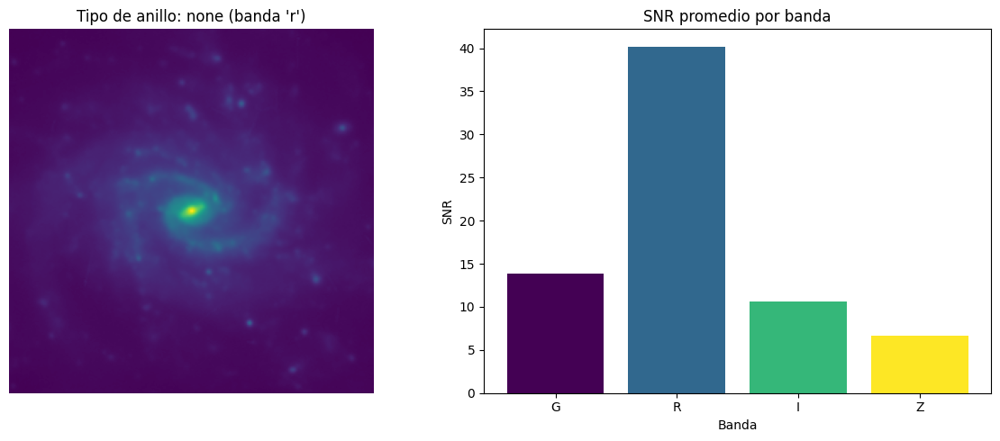

In [ ]:
# Galaxia de ejemplo 
idx_example = 42
fname = os.path.basename(df_ok["fits_path"][idx_example])
sample_path = os.path.join(FITS, fname)
idx_example = 42
fname = os.path.basename(df_ok.loc[idx_example, "fits_path"])
sample_path = os.path.join(FITS, fname)

# -Abre el FITS y extrae la imagen
with fits.open(sample_path, memmap=True) as hdul:
    fluxcube = hdul[0].data
    hdr      = hdul[0].header
    bands    = _band_order_from_hdr(hdr)  # ['g','r','i','z']
    lower    = [b.lower() for b in bands]
    bi       = lower.index('r') if 'r' in lower else 0
    img_r    = fluxcube[bi]

# Calcular el SNR promedio por banda 
snr_vals, bands = mean_snr_all_bands_from_fits(sample_path)
labels = [b.upper() for b in bands]
values = snr_vals
ring_type_val = df_ok.loc[idx_example, "ring_type"]
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Imagen de la galaxia
ax1.imshow(img_r, origin="lower")
ax1.set_title(f"Tipo de anillo: {ring_type_val} (banda '{bands[bi]}')")
ax1.axis("off")

# Barras SNR por banda
ax2.bar(labels, values)
ax2.set_title("SNR promedio por banda")
ax2.set_ylabel("SNR")
ax2.set_xlabel("Banda")
cmap   = plt.cm.get_cmap("viridis", len(values))
colors = cmap(np.arange(len(values)))
ax2.bar(labels, values, color=colors)

plt.tight_layout()
plt.show()

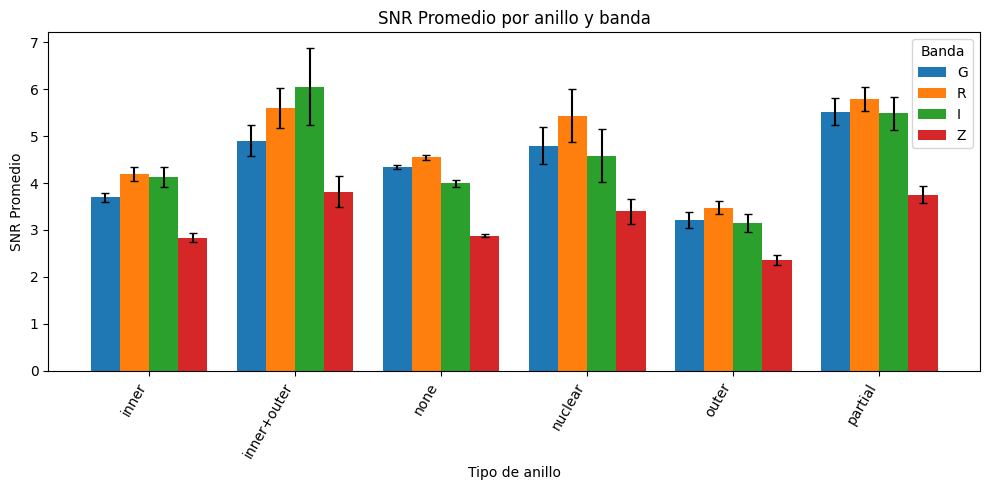

In [ ]:
# Bandas procesadas
BANDS = [b for b in ("g","r","i","z") if f"snr_{b}" in df_ok.columns]

# Columnas a usar
snr_cols = {f"snr_{b}": b for b in BANDS}
tmp = df_ok.copy()

# Convertir a numérico y conservar solo valores validos
for c in snr_cols:
    tmp[c] = pd.to_numeric(tmp[c], errors="coerce")

long = tmp.melt(id_vars=["ring_type"], value_vars=list(snr_cols.keys()),
                var_name="snr_col", value_name="snr")
long["band"] = long["snr_col"].map(snr_cols)
long = long[np.isfinite(long["snr"])]

# Orden de los datos
type_order = sorted(long["ring_type"].dropna().astype(str).unique().tolist())
band_order = [b for b in ("g","r","i","z") if b in long["band"].unique()]

# Barras agrupadas: SNR medio por tipo de anillo y banda
agg = (long.groupby(["ring_type", "band"])
            .agg(n=("snr","size"), mean=("snr","mean"), std=("snr","std"))
            .reset_index())
agg["sem"] = agg["std"] / np.sqrt(agg["n"].clip(lower=1))

x = np.arange(len(type_order))
width = 0.8 / max(1, len(band_order))

plt.figure(figsize=(max(10, 0.8*len(type_order)), 5))
for j, b in enumerate(band_order):
    sub = agg[agg["band"] == b].set_index("ring_type").reindex(type_order)
    y = sub["mean"].values
    yerr = sub["sem"].values
    positions = x + (j - (len(band_order)-1)/2) * width
    plt.bar(positions, y, width=width, label=b.upper(), yerr=yerr, capsize=3)

plt.xticks(x, [str(t) for t in type_order], rotation=60, ha="right")
plt.ylabel("SNR Promedio")
plt.xlabel("Tipo de anillo")
plt.title("SNR Promedio por anillo y banda")
plt.legend(title="Banda")
plt.tight_layout()
plt.show()

Banda G: N=12387  media=4.206  mediana=3.015  σ=4.846
Banda R: N=12387  media=4.514  mediana=3.087  σ=6.092
Banda I: N=5847  media=4.145  mediana=2.718  σ=6.275
Banda Z: N=12387  media=2.925  mediana=1.963  σ=4.155


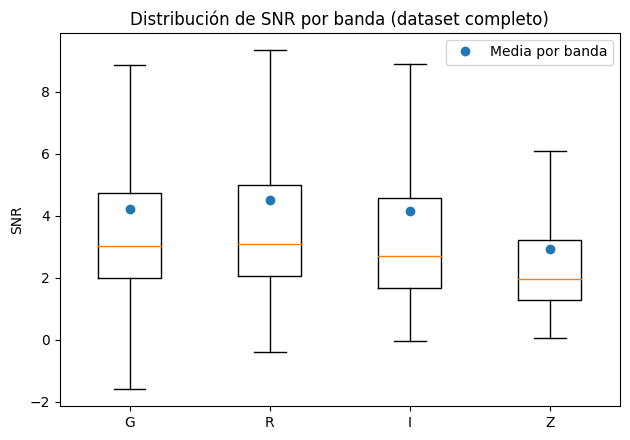

In [ ]:
# Extrae los datos de cada banda
series, labels = [], []
for b in BANDS:
    s = pd.to_numeric(df_ok[f"snr_{b}"], errors="coerce")
    s = s[np.isfinite(s)]
    if len(s): series.append(s.values); labels.append(b.upper())

# Obtiene el promedio de SNR de cada banda
means = [np.mean(v) for v in series]

# Estadisticas
for lab, vals, m in zip(labels, series, means):
    print(f"Banda {lab}: N={len(vals)}  media={m:.3f}  mediana={np.median(vals):.3f}  σ={np.std(vals, ddof=1):.3f}")

# Boxplot
plt.figure(figsize=(max(6, 1.6*len(labels)), 4.5))
plt.boxplot(series, showfliers=False)
plt.plot(np.arange(1, len(labels)+1), means, "o", label="Media por banda")
plt.xticks(np.arange(1, len(labels)+1), labels)
plt.ylabel("SNR")
plt.title("Distribución de SNR por banda (dataset completo)")
plt.legend()
plt.tight_layout()
plt.show()

### Resultados de analisis del SNR

* Las distribuciones estan sesgadas a la derecha. En todas las bandas la media > mediana, lo que indica una cola de objetos con SNR alto (pocas galaxias muy “buenas”) y muchos con SNR bajo–moderado (medianas ~2–3).

* Los resultados contienen heterogeneidad; Los valores σ (sigma) son grandes comparados con las medias (Coeficiciente de variacion ≈1.1–1.5), esta es una señal de variación fuerte entre objetos/campos (profundidad, tamaño de la galaxia, etc.).

* Hay muchos SNR invalidos en i (invvar=0, NaN o cobertura de datos ausente).

* La mejor banda en promedio es **r**. Con media 4.51 y mediana 3.09 (ligeramente > g). z es la peor (media 2.93, mediana 1.96). Esto se alinea con nuestras expectaciones: en z el cielo es más brillante y la eficiencia suele ser menor, bajando el SNR; r/g tienden a tener mejor profundidad efectiva.

## Conclusiones

* Clases y severo desbalanceo. 4 clases: none, inner, outer, inner+outer. Distribución ≈ none 6660 (82.5%), inner 857 (10.6%), inner+outer 372 (4.6%), outer 186 (2.3%). Esto podria llevar hacia un sesgo alto con la clase “none” y un riesgo de bajo recall en las clases "outer" e "inner+outer". 
  * El conjunto es marcadamente desbalanceado; para un clasificador fiable será necesario estratificar los splits, usar class weights o focal loss, y aplicar oversampling + aumentación específicamente sobre outer e inner+outer. Las métricas de referencia deben ser macro-F1 y per-class recall, no solo accuracy.

* Estadística por canal y clase: Los histogramas/entropías muestran diferencias de brillo y textura entre clases; outer tiende a menor brillo medio global; inner+outer muestra contraste en g/r; la entropía de i es particularmente baja en none, sugiriendo poca información útil en i para ciertos casos.
  * Existe señal morfológica/fotométrica discriminativa por clase, especialmente en g/r. Es viable explotar rasgos radiales/texturales (p. ej., perfiles de brillo, gradientes y entropía local) e integrar atención espacial en CNNs. El canal i aporta menos información en muchos none, por lo que conviene ponderarlo o enmascararlo cuando su utilidad sea baja.

* Transformaciones útiles para visualización y señal débil: El estiramiento logarítmico con normalización robusta (tipo ZScale/percentiles) mejora detalles tenues y reduce la dominancia de “outliers” brillantes. Centrar la galaxia y mantener escala consistente facilita comparabilidad.
  * Se podria adoptar log-stretch + normalización robusta como preprocesamiento estándar para aumentar la relación señal-ruido percibida de los anillos y estabilizar el entrenamiento. 
  * Ademas se debe asegurar centrado y escala fija por objeto mejora la coherencia del conjunto y facilitar que el modelo aprenda patrones anulares sutiles.
* Calidad fotométrica/SNR por banda: Las distribuciones de SNR están sesgadas a la derecha (pocos objetos con SNR muy alto y muchos con SNR bajo–moderado). En promedio r ≳ g > i > z; z es la más débil y i presenta muchos SNR inválidos o cobertura ausente (invvar=0/NaN). Medianas típicas ~2–3 por banda.
  * Para robustez, conviene priorizar r y g como canales principales, tratar z como apoyo y manejar i con máscaras/indicadores de presencia. Implementar channel dropout y estrategias missing-aware evitará degradación cuando falten bandas o haya SNR bajo.

